## Importing the libraries

In [ ]:
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import re
from tqdm import tqdm

import pandas as pd
import seaborn as sns
import gensim

from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/train.csv', skiprows=1, names=['id', 'comment_text', 'toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate'])
df

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
159566,ffe987279560d7ff,""":::::And for the second time of asking, when ...",0,0,0,0,0,0
159567,ffea4adeee384e90,You should be ashamed of yourself \n\nThat is ...,0,0,0,0,0,0
159568,ffee36eab5c267c9,"Spitzer \n\nUmm, theres no actual article for ...",0,0,0,0,0,0
159569,fff125370e4aaaf3,And it looks like it was actually you who put ...,0,0,0,0,0,0


In [ ]:
df["comment_text"]

0         Explanation\nWhy the edits made under my usern...
1         D'aww! He matches this background colour I'm s...
2         Hey man, I'm really not trying to edit war. It...
3         "\nMore\nI can't make any real suggestions on ...
4         You, sir, are my hero. Any chance you remember...
                                ...                        
159566    ":::::And for the second time of asking, when ...
159567    You should be ashamed of yourself \n\nThat is ...
159568    Spitzer \n\nUmm, theres no actual article for ...
159569    And it looks like it was actually you who put ...
159570    "\nAnd ... I really don't think you understand...
Name: comment_text, Length: 159571, dtype: object

In [ ]:
df.shape

(159571, 8)

In [ ]:
df.describe()

,toxic,severe_toxic,obscene,threat,insult,identity_hate
count,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000
mean,0.095844,0.009996,0.052948,0.002996,0.049364,0.008805
std,0.294379,0.099477,0.223931,0.054650,0.216627,0.093420
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df.corr()

<ipython-input-7-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,toxic,severe_toxic,obscene,threat,insult,identity_hate
toxic,1.000000,0.308619,0.676515,0.157058,0.647518,0.266009
severe_toxic,0.308619,1.000000,0.403014,0.123601,0.375807,0.201600
obscene,0.676515,0.403014,1.000000,0.141179,0.741272,0.286867
threat,0.157058,0.123601,0.141179,1.000000,0.150022,0.115128
insult,0.647518,0.375807,0.741272,0.150022,1.000000,0.337736
identity_hate,0.266009,0.201600,0.286867,0.115128,0.337736,1.000000


## Text Preprocessing

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# Removing the stopwords
stop = stopwords.words('english')
df['comment_text'] = df['comment_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
df


,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation Why edits made username Hardcore M...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches background colour I'm seemin...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really trying edit war. It's guy ...",0,0,0,0,0,0
3,0001b41b1c6bb37e,""" More I can't make real suggestions improveme...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, hero. Any chance remember page that'...",0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
159566,ffe987279560d7ff,""":::::And second time asking, view completely ...",0,0,0,0,0,0
159567,ffea4adeee384e90,You ashamed That horrible thing put talk page....,0,0,0,0,0,0
159568,ffee36eab5c267c9,"Spitzer Umm, theres actual article prostitutio...",0,0,0,0,0,0
159569,fff125370e4aaaf3,And looks like actually put speedy first versi...,0,0,0,0,0,0


In [ ]:
# Performing Lemmatization

nltk.download('wordnet')

lemma = WordNetLemmatizer()
def lemmatize_words(text):
      words = text.split()
      words = [lemma.lemmatize(word,pos='v') for word in words]
      return ' '.join(words)
df['comment_text'] = df['comment_text'].apply(lemmatize_words)

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
df

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation Why edit make username Hardcore Me...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He match background colour I'm seemingl...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really try edit war. It's guy con...",0,0,0,0,0,0
3,0001b41b1c6bb37e,""" More I can't make real suggestions improveme...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, hero. Any chance remember page that'...",0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
159566,ffe987279560d7ff,""":::::And second time asking, view completely ...",0,0,0,0,0,0
159567,ffea4adeee384e90,You ashamed That horrible thing put talk page....,0,0,0,0,0,0
159568,ffee36eab5c267c9,"Spitzer Umm, theres actual article prostitutio...",0,0,0,0,0,0
159569,fff125370e4aaaf3,And look like actually put speedy first versio...,0,0,0,0,0,0


In [ ]:
classes = ['toxic', 'severe_toxic','obscene','threat','insult','identity_hate']
df[classes].sum()

toxic            15294
severe_toxic      1595
obscene           8449
threat             478
insult            7877
identity_hate     1405
dtype: int64

In [ ]:
X = df.comment_text
Y = df.drop(['id', 'comment_text'], axis = 1)

In [ ]:
print(X.shape, Y.shape)

(159571,) (159571, 6)


In [ ]:
X_train, X_test, y_train, y_test= train_test_split(X, Y, test_size=0.2, random_state=1)

In [ ]:
X_train.head()

150865    " I've indicate block editor comment might all...
59427     And even more, userboxes I others have, page, ...
150060    " wikipedia's censorship I look Bash Back (The...
108405    Wikipedia New York Meet-Up Howdy! Please come ...
139314                                 crazy german nutcase
Name: comment_text, dtype: object

In [ ]:
y_train.head()

,toxic,severe_toxic,obscene,threat,insult,identity_hate
150865,0,0,0,0,0,0
59427,0,0,0,0,0,0
150060,0,0,0,0,0,0
108405,0,0,0,0,0,0
139314,1,0,0,0,0,0


In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(127656,)
(127656, 6)
(31915,)
(31915, 6)


In [ ]:
corpus = df['comment_text'].to_numpy()
corpus

array(["Explanation Why edit make username Hardcore Metallica Fan reverted? They vandalisms, closure GAs I vote New York Dolls FAC. And please remove template talk page since I'm retire now.89.205.38.27",
       "D'aww! He match background colour I'm seemingly stick with. Thanks. (talk) 21:51, January 11, 2016 (UTC)",
       "Hey man, I'm really try edit war. It's guy constantly remove relevant information talk edit instead talk page. He seem care format actual info.",
       ...,
       'Spitzer Umm, theres actual article prostitution ring. - Crunch Captain.',
       'And look like actually put speedy first version delete I look it.',
       '" And ... I really think understand. I come idea bad right away. What kind community go ""you bad ideas"" go away, instead help rewrite them. "'],
      dtype=object)

## Feature Extraction

In [ ]:
# Vectorizing text using TF-IDF Vectorization

word_vectorizer = TfidfVectorizer(
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    ngram_range=(1, 3),
    sublinear_tf=True)

word_vectorizer.fit(X_train)
train_word_features = word_vectorizer.transform(X_train)
test_features = word_vectorizer.transform(X_test)

In [ ]:
print(test_features[10])


  (0, 6284838)	0.22106933327899417
  (0, 6277426)	0.052893733170083536
  (0, 6256725)	0.22666239971073465
  (0, 6255622)	0.1133751787665193
  (0, 6068713)	0.16356990102617608
  (0, 6047468)	0.10539060391148539
  (0, 5879806)	0.22666239971073465
  (0, 5879030)	0.13917785748030426
  (0, 5877490)	0.15075953607344375
  (0, 5866584)	0.11830489338505713
  (0, 5761534)	0.122337997194572
  (0, 5090456)	0.1467394819603386
  (0, 5082757)	0.06951168622309085
  (0, 4697861)	0.16434252580693365
  (0, 4341952)	0.1907761478721975
  (0, 4336373)	0.13901392790428332
  (0, 3981825)	0.08580284043732705
  (0, 3776811)	0.21673101391248561
  (0, 3775261)	0.10527694559156572
  (0, 3773372)	0.10984006512562823
  (0, 3402174)	0.23454538409719455
  (0, 3402168)	0.2032549630942852
  (0, 3393675)	0.07860705114775411
  (0, 3392689)	0.23454538409719455
  (0, 3386459)	0.07470738751795993
  (0, 3358533)	0.22666239971073465
  (0, 3358072)	0.09786123331162874
  (0, 3113108)	0.22106933327899417
  (0, 3112705)	0.14163046

In [ ]:
#Word2Vec Vectorization
DIM = 100

X = [d.split() for d in corpus]
w2v_model = gensim.models.Word2Vec(sentences = X, vector_size = DIM, window = 10, min_count = 1)

In [ ]:
len(w2v_model.wv.key_to_index.keys())

521446

In [ ]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)
X = tokenizer.texts_to_sequences(X)
X

[[688,
  173,
  7,
  10,
  692,
  5049,
  15720,
  954,
  13491,
  223,
  61198,
  7249,
  2653,
  1,
  536,
  58,
  1285,
  19828,
  10018,
  50,
  11,
  42,
  416,
  14,
  5,
  77,
  25,
  3246,
  158305],
 [158306,
  149,
  1001,
  1623,
  3100,
  25,
  4302,
  854,
  1711,
  333,
  197,
  45542,
  864,
  3698,
  11591,
  133],
 [447,
  2023,
  25,
  72,
  47,
  7,
  1468,
  134,
  305,
  2030,
  42,
  433,
  64,
  14,
  7,
  317,
  14,
  71,
  149,
  57,
  310,
  893,
  561,
  2929],
 [2,
  1091,
  1,
  156,
  10,
  256,
  1627,
  2712,
  17,
  1,
  511,
  76,
  2859,
  560,
  1612,
  4513,
  52046,
  99587,
  18355,
  16,
  89,
  31,
  32,
  6188,
  1214,
  893,
  4846,
  463,
  893,
  493,
  1,
  560,
  1612,
  4687,
  311,
  63,
  17,
  7405,
  893,
  425,
  89,
  33,
  11,
  150,
  1066,
  105,
  187,
  6102,
  3,
  232,
  1,
  491,
  31,
  4324,
  4472,
  573,
  711,
  134,
  59,
  433,
  406,
  7796,
  158307,
  2],
 [213, 3622, 15721, 638, 955, 468, 5, 130, 5543],
 [2, 4008,

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

X = pad_sequences(X, padding = 'pre', maxlen = 20)
X[:3]

array([[   223,  61198,   7249,   2653,      1,    536,     58,   1285,
         19828,  10018,     50,     11,     42,    416,     14,      5,
            77,     25,   3246, 158305],
       [     0,      0,      0,      0, 158306,    149,   1001,   1623,
          3100,     25,   4302,    854,   1711,    333,    197,  45542,
           864,   3698,  11591,    133],
       [    47,      7,   1468,    134,    305,   2030,     42,    433,
            64,     14,      7,    317,     14,     71,    149,     57,
           310,    893,    561,   2929]], dtype=int32)

In [ ]:
vocab_size = len(tokenizer.word_index) + 1
vocab = tokenizer.word_index

In [ ]:
vocab.items()

dict_items([('i', 1), ('"', 2), ('article', 3), ('the', 4), ('page', 5), ('you', 6), ('edit', 7), ('use', 8), ('would', 9), ('make', 10), ('please', 11), ('like', 12), ('if', 13), ('talk', 14), ('one', 15), ('think', 16), ('-', 17), ('wikipedia', 18), ('see', 19), ('get', 20), ('know', 21), ('say', 22), ('go', 23), ('add', 24), ("i'm", 25), ('it', 26), ('this', 27), ('also', 28), ('source', 29), ('people', 30), ('may', 31), ('need', 32), ('want', 33), ('take', 34), ('find', 35), ('even', 36), ('block', 37), ('look', 38), ('time', 39), ('delete', 40), ('link', 41), ('remove', 42), ('thank', 43), ('could', 44), ('name', 45), ('good', 46), ('try', 47), ('give', 48), ('write', 49), ('and', 50), ('fuck', 51), ('in', 52), ('it.', 53), ('change', 54), ('work', 55), ('a', 56), ('seem', 57), ('new', 58), ('list', 59), ('comment', 60), ('read', 61), ('do', 62), ('first', 63), ('information', 64), ('image', 65), ('many', 66), ('point', 67), ('help', 68), ('come', 69), ('ask', 70), ('page.', 71), 

In [ ]:
def get_weights_matrix(model) :
    weights_matrix = np.zeros((vocab_size, DIM))

    for word, i in vocab.items() :
            try:
              weights_matrix[i] = model.wv[word]
            except:
              pass

    return weights_matrix


embedding_vectors = get_weights_matrix(w2v_model)

# Model Training

In [ ]:
# Logistic Regression
losses = []
auc = []

for class_name in classes:
    #call the labels one column at a time so we can run the classifier on them
    train_target = y_train[class_name]
    test_target = y_test[class_name]
    classifier = LogisticRegression(solver='sag', C=10)

    cv_loss = np.mean(cross_val_score(classifier, train_word_features, train_target, cv=5, scoring='neg_log_loss'))
    losses.append(cv_loss)
    print('CV Log_loss score for class {} is {}'.format(class_name, cv_loss))

    cv_score = np.mean(cross_val_score(classifier, train_word_features, train_target, cv=5, scoring='accuracy'))
    print('CV Accuracy score for class {} is {}'.format(class_name, cv_score))

    classifier.fit(train_word_features, train_target)
    y_pred = classifier.predict(test_features)
    y_pred_prob = classifier.predict_proba(test_features)[:, 1]
    auc_score = metrics.roc_auc_score(test_target, y_pred_prob)
    auc.append(auc_score)
    print("CV ROC_AUC score {}\n".format(auc_score))

    print(confusion_matrix(test_target, y_pred))
    print(classification_report(test_target, y_pred))

print('Total average CV Log_loss score is {}'.format(np.mean(losses)))
print('Total average CV ROC_AUC score is {}'.format(np.mean(auc)))

CV Log_loss score for class toxic is -0.12366837523725069
CV Accuracy score for class toxic is 0.9523328233834276
CV ROC_AUC score 0.9733827995541479

[[28420   392]
 [  871  2232]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     28812
           1       0.85      0.72      0.78      3103

    accuracy                           0.96     31915
   macro avg       0.91      0.85      0.88     31915
weighted avg       0.96      0.96      0.96     31915

CV Log_loss score for class severe_toxic is -0.029563241943306933
CV Accuracy score for class severe_toxic is 0.9904822344206485
CV ROC_AUC score 0.9864679369366772

[[31376   236]
 [  147   156]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     31612
           1       0.40      0.51      0.45       303

    accuracy                           0.99     31915
   macro avg       0.70      0.75      0.72     31915
weighted avg       0.9

KeyboardInterrupt: ignored

In [ ]:
import tensorflow as tf
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Flatten, Dropout, Dense, LSTM, Embedding
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.callbacks import EarlyStopping



In [ ]:
model = Sequential()

model.add(Embedding(vocab_size, output_dim = DIM, weights = [embedding_vectors], input_length = 20))
model.add(Dropout(0.2))

model.add(LSTM(64))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(1, activation = 'linear'))

In [ ]:
model.compile(loss = 'mean_squared_error', optimizer = 'adam', metrics = 'accuracy')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 20, 100)           46349400  
                                                                 
 dropout (Dropout)           (None, 20, 100)           0         
                                                                 
 lstm (LSTM)                 (None, 64)                42240     
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense (Dense)               (None, 64)                4160      
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 64)                4

In [ ]:
x_train2, x_test2, y_train2, y_test2 = train_test_split(X, Y, test_size = 0.2, random_state = 0)

es = EarlyStopping(patience=3,
                   monitor='loss',
                   restore_best_weights=True,
                   mode='min',
                   verbose=1)

# train the model
hist = model.fit(x_train2, y_train2, validation_data = (x_test2, y_test2), epochs = 10, callbacks=es, batch_size = 32, shuffle=True)

Epoch 1/10
3990/3990 [==============================] - 86s 22ms/step - loss: 0.0264 - accuracy: 0.9644 - val_loss: 0.0251 - val_accuracy: 0.9642
Epoch 2/10
3990/3990 [==============================] - 70s 18ms/step - loss: 0.0238 - accuracy: 0.9653 - val_loss: 0.0249 - val_accuracy: 0.9651
Epoch 3/10
3990/3990 [==============================] - 71s 18ms/step - loss: 0.0226 - accuracy: 0.9662 - val_loss: 0.0250 - val_accuracy: 0.9651
Epoch 4/10
3990/3990 [==============================] - 68s 17ms/step - loss: 0.0218 - accuracy: 0.9669 - val_loss: 0.0252 - val_accuracy: 0.9650
Epoch 5/10
3990/3990 [==============================] - 67s 17ms/step - loss: 0.0214 - accuracy: 0.9674 - val_loss: 0.0253 - val_accuracy: 0.9648
Epoch 6/10
3990/3990 [==============================] - 67s 17ms/step - loss: 0.0212 - accuracy: 0.9676 - val_loss: 0.0254 - val_accuracy: 0.9648
Epoch 7/10
3990/3990 [==============================] - 67s 17ms/step - loss: 0.0210 - accuracy: 0.9678 - val_loss: 0.0253 -

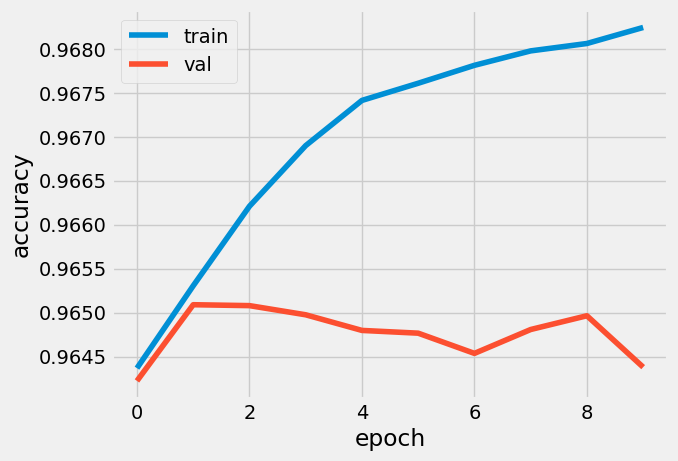

In [ ]:
plt.style.use('fivethirtyeight')

# visualize the models accuracy
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc = 'upper left')
plt.show()